In [42]:
import copy
import graphviz
import pathlib
import pygraphviz as pgv

from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from Bio import SeqIO
from collections import defaultdict
from IPython.display import Image

In [2]:
DATA_PATH = "data/5/"

In [3]:
class Edge:
    def __init__(self, sequence, cov=1, cnt=1):
        self.sequence = sequence
        self.cov = cov
        self.cnt = cnt
    
    def update(self):
        self.cov /= self.cnt
        self.cnt = 1

In [4]:
class Graph:
    def __init__(self):
        self.outgoing = defaultdict(list)
        self.incoming = defaultdict(list)
        self.edges = defaultdict(dict)
        self.vertexes = set()
        
        
    def add_edge(self, start, end, sequence, cov, cnt):
        """Add a new edge between vertexes 'start' and 'end'
        with sequence 'sequence' and coverage 'cov'.
        If such edge already exists, increase coverage.
        
        """
        if not end in self.edges[start]:
            self.edges[start][end] = set()
        edges = list(self.edges[start][end])
        edges_sequences = [edge.sequence for edge in edges]
        if sequence in edges_sequences:
            edges[edges_sequences.index(sequence)].cov += cov
        else:
            self.outgoing[start].append(end)
            self.incoming[end].append(start)
            self.edges[start][end].add(Edge(sequence, cov, cnt))
            self.vertexes.add(start)
            self.vertexes.add(end)
    
    
    def add_k_plus_1_mer(self, k_plus_1_mer):
        """If the k+1-mer is not yet in the graph, it creates a new edge. 
        Otherwise, increases the edge coverage.
        
        """
        start = k_plus_1_mer[0:-1]
        end = k_plus_1_mer[1:]
        self.add_edge(start, end, k_plus_1_mer, 1, 1)
            
    
    def delete_edge(self, start, end, sequence):
        """Removes an edge regardless of its coverage, if it exists.
        
        """
        if not start in self.edges or not end in self.edges[start]:
            return
        edge_to_delete = None
        for edge in self.edges[start][end]:
            if edge.sequence == sequence:
                edge_to_delete = edge
                break
        if edge_to_delete == None:
            return
        self.outgoing[start].remove(end)
        self.incoming[end].remove(start)
        self.edges[start][end].remove(edge_to_delete)
        if len(self.edges[start][end]) == 0:
            del self.edges[start][end]
        if len(self.outgoing[end]) == 0 and len(self.incoming[end]) == 0:
            self.vertexes.remove(end)
        if len(self.outgoing[start]) == 0 and len(self.incoming[start]) == 0:
            self.vertexes.remove(start)
            
    
    def update_edges(self):
        """Call Edge.update() for each edge in the graph
        
        """
        for start in self.edges:
            for end in self.edges[start]:
                for edge in self.edges[start][end]:
                    edge.update()

In [5]:
class DeBrujinGraph:
    def __init__(self, k, filepath, paired_reads=False):
        self.k = k
        self.filepath = filepath
        self.paired_reads = paired_reads
        self.graph = Graph()
        
        
    def __get_reverse_complimentary(self, seq):
        """Builds a reverse-complementary nucleotide sequence.
        
        """
        reversing_dict = {'A' : 'T', 'G' : 'C', 'T' : 'A', 'C' : 'G'}
        reversed_seq = ''
        for na in seq:
            reversed_seq += reversing_dict[na]
        return reversed_seq[::-1]
        
        
    def __get_k_plus_1_mears(self, read):
        """Cuts sequence to a list of k+1-mers.
        
        """
        k_plus_1_mers = []
        k_plus_1_mer = read[0 : self.k+1]
        k_plus_1_mers.append(k_plus_1_mer)
        if self.paired_reads == True:
            reversed_k_plus_1_mer = self.__get_reverse_complimentary(k_plus_1_mer)
            k_plus_1_mers.append(reversed_k_plus_1_mer)
        for i in range(1, len(read) - self.k):
            k_plus_1_mer = k_plus_1_mer[1:] + read[i+self.k]
            k_plus_1_mers.append(k_plus_1_mer)
            if self.paired_reads == True:
                reversed_k_plus_1_mer = self.__get_reverse_complimentary(k_plus_1_mer)
                k_plus_1_mers.append(reversed_k_plus_1_mer)
        return k_plus_1_mers
    
    
    def build_primary_graph(self):
        """Builds classic de Bruijn graph.
        
        """
        file_type = pathlib.PurePath(self.filepath).suffix[1:]
        with open(self.filepath, 'r') as f:
            for record in SeqIO.parse(f, file_type):
                k_plus_1_mers = self.__get_k_plus_1_mears(str(record.seq))
                for k_plus_1_mer in k_plus_1_mers:
                    self.graph.add_k_plus_1_mer(k_plus_1_mer)
        
        
    def __glue_edges(self, start, mid, end):
        """Connects 2 edges into one and adds their coverages.
        
        """
        first_edge = list(self.graph.edges[start][mid])[0]
        second_edge = list(self.graph.edges[mid][end])[0]
        seq = first_edge.sequence + second_edge.sequence[self.k:] 
        cov = first_edge.cov + second_edge.cov
        cnt = first_edge.cnt + second_edge.cnt
        self.graph.delete_edge(start, mid, first_edge.sequence)
        self.graph.delete_edge(mid, end, second_edge.sequence)
        self.graph.add_edge(start, end, seq, cov, cnt)
        
    
    def condense_graph(self):
        """Finds all sections of the graph consisting of consecutive 
        vertices with one incoming and outgoing edges. Replaces each 
        such section with one edge, the coverage of which is equal 
        to the arithmetic mean of all the edges included in it.
        
        """
        vertexes = copy.deepcopy(self.graph.vertexes)
        for v in vertexes:
            if len(self.graph.incoming[v]) == 1 and len(self.graph.outgoing[v]) == 1:
                start = self.graph.incoming[v][0]
                end = self.graph.outgoing[v][0]
                self.__glue_edges(start, v, end)
        self.graph.update_edges()
        
    
    def tip_clipper(self, cov_treshold, len_treshold):
        """Finds the end edges. If they are shorter than the len_threshold 
        and less covered than the cov_threshold, they are removed.
        
        """
        vertexes = copy.deepcopy(self.graph.vertexes)
        for v in vertexes:
            if (len(self.graph.outgoing[v]) == 0 and len(self.graph.incoming[v]) == 1 or
                    len(self.graph.outgoing[v]) == 1 and len(self.graph.incoming[v]) == 0):
                if len(self.graph.outgoing[v]) == 0 and len(self.graph.incoming[v]) == 1:
                    start = self.graph.incoming[v][0]
                    end = v
                else:
                    start = v
                    end = self.graph.outgoing[v][0]
                edge = list(self.graph.edges[start][end])[0]
                if len(edge.sequence) < len_treshold and edge.cov < cov_treshold:
                    self.graph.delete_edge(start, end, edge.sequence)  
    
    
    def edge_filter(self, cov_treshold, len_treshold):
        """Delete all edges, if they are shorter than the len_threshold 
        and less covered than the cov_threshold.
        
        """
        edges = copy.deepcopy(self.graph.edges)
        for start in edges:
            for end in edges[start]:
                for edge in edges[start][end]:
                    if len(edge.sequence) < len_treshold and edge.cov < cov_treshold:
                        self.graph.delete_edge(start, end, edge.sequence)
    
    
    def simplify_graph(self, simplification_algo, cov_treshold, len_treshold):
        if simplification_algo == 'tip_clipper':
            self.tip_clipper(cov_treshold, len_treshold)
        elif simplification_algo == 'edge_filter':
            self.edge_filter(cov_treshold, len_treshold)
        else:
            raise NameError("{simplification_algo} simplification algorithm is not defined")
        
        
    def build_graph(self, simplification_algo, cov_treshold, len_treshold):
        """Builds simplified and condenced graph from scratch.
        
        """
        self.build_primary_graph()
        self.condense_graph()
        self.simplify_graph(simplification_algo, cov_treshold, len_treshold)
        self.condense_graph()
    
    
    def print_edges_to_fasta(self, filepath):
        """Outputs self.graph edges and there coverages
        and lengths in fasta format into file `filepath`.
        
        """
        sequences = []
        i = 0
        for start in self.graph.edges:
            for end in self.graph.edges[start]:
                for edge in self.graph.edges[start][end]:
                    seq_record = SeqRecord(Seq(edge.sequence), id=str(i), name='Edge', 
                                           description=f'Coverage {edge.cov}, Length {len(edge.sequence)}')
                    sequences.append(seq_record)
                    i += 1
        with open(filepath, 'w') as out_file:
            SeqIO.write(sequences, out_file, "fasta")
            
            
    def print_draw_graph(self, dot_file_path, pdf_path):
        """Outputs self.graph in DOT format into `dot_file_path`
        and draw self.graph in pdf format into pdf_path.
        
        """
        graph = pgv.AGraph(directed=True)
        id_for_vertex = dict()
        for start in self.graph.edges:
            for end in self.graph.edges[start]:
                for edge in self.graph.edges[start][end]:
                    if not start in id_for_vertex:
                        id_for_vertex[start] = len(id_for_vertex)
                    if not end in id_for_vertex:
                        id_for_vertex[end] = len(id_for_vertex)
                    graph.add_edge(id_for_vertex[start], id_for_vertex[end], 
                                        label=f'Coverage {round(edge.cov, 2)}, Length {len(edge.sequence)}',
                                        fontsize='10'
                                  )
        graph.write(dot_file_path)
        graph.draw(pdf_path, prog='dot', format='pdf')

## Build graph from 's_6.first1000.fastq'

In [6]:
graph1000 = DeBrujinGraph(55, DATA_PATH + 's_6.first1000.fastq', True)
graph1000.build_primary_graph()
graph1000.condense_graph()

condensed1000 = copy.deepcopy(graph1000.graph)

In [7]:
graph1000.print_edges_to_fasta('s_6.first1000_condensed.fasta')
graph1000.print_draw_graph('s_6.first1000_condensed.dot', 's_6.first1000_condensed.pdf')

Graph has lots of single edges + two small graphs.

### s_6.first1000.fastq with tip_clipper with cov_treshold 2 and len_treshold 60

In [8]:
graph1000.graph = copy.deepcopy(condensed1000)
graph1000.tip_clipper(2, 60)
graph1000.condense_graph()

graph1000.print_edges_to_fasta('s_6.first1000_tip_clipper_2_60.fasta')
graph1000.print_draw_graph('s_6.first1000_tip_clipper_2_60.dot', 's_6.first1000_tip_clipper_2_60.pdf')

### s_6.first1000.fastq with edge_filter with cov_treshold 2 and len_treshold 60

In [9]:
graph1000.graph = copy.deepcopy(condensed1000)
graph1000.edge_filter(2, 60)
graph1000.condense_graph()

graph1000.print_edges_to_fasta('s_6.first1000_edge_filter_2_60.fasta')
graph1000.print_draw_graph('s_6.first1000_edge_filter_2_60.dot', 's_6.first1000_edge_filter_2_60.pdf')

With these thresholds edge_filter and tip_clipper give the same result.

### s_6.first1000.fastq with tip_clipper with cov_treshold 10 and len_treshold 60

In [10]:
graph1000.graph = copy.deepcopy(condensed1000)
graph1000.tip_clipper(10, 60)
graph1000.condense_graph()

graph1000.print_edges_to_fasta('s_6.first1000_tip_clipper_10_60.fasta')
graph1000.print_draw_graph('s_6.first1000_tip_clipper_10_60.dot', 's_6.first1000_tip_clipper_10_60.pdf')

### s_6.first1000.fastq with edge_filter with cov_treshold 2 and len_treshold 60

In [11]:
graph1000.graph = copy.deepcopy(condensed1000)
graph1000.edge_filter(10, 60)
graph1000.condense_graph()

graph1000.print_edges_to_fasta('s_6.first1000_edge_filter_10_60.fasta')
graph1000.print_draw_graph('s_6.first1000_edge_filter_10_60.dot', 's_6.first1000_edge_filter_10_60.pdf')

With these thresholds edge_filter and tip_clipper also give the same result, but graph is much simplier, than the one with thresholds 2, 60.

## Building a graph from s_6.first10000.fastq

In [12]:
graph10000 = DeBrujinGraph(55, DATA_PATH + 's_6.first10000.fastq', True)
graph10000.build_primary_graph()
graph10000.condense_graph()

condensed10000 = copy.deepcopy(graph10000.graph)

In [13]:
graph10000.print_edges_to_fasta('s_6.first10000_condensed.fasta')
graph10000.print_draw_graph('s_6.first10000_condensed.dot', 's_6.first10000_condensed.pdf')

Graph has lots of single edges with low coverage and length + 1 big graph.

### s_6.first10000.fastq with tip_clipper with cov_treshold 2 and len_treshold 60

In [14]:
graph10000.tip_clipper(2, 60)
graph10000.condense_graph()

graph10000.print_edges_to_fasta('s_6.first10000_tip_clipper_2_60.fasta')
graph10000.print_draw_graph('s_6.first10000_tip_clipper_2_60.dot', 's_6.first10000_tip_clipper_2_60.pdf')

This graph still have a lot of single edges.

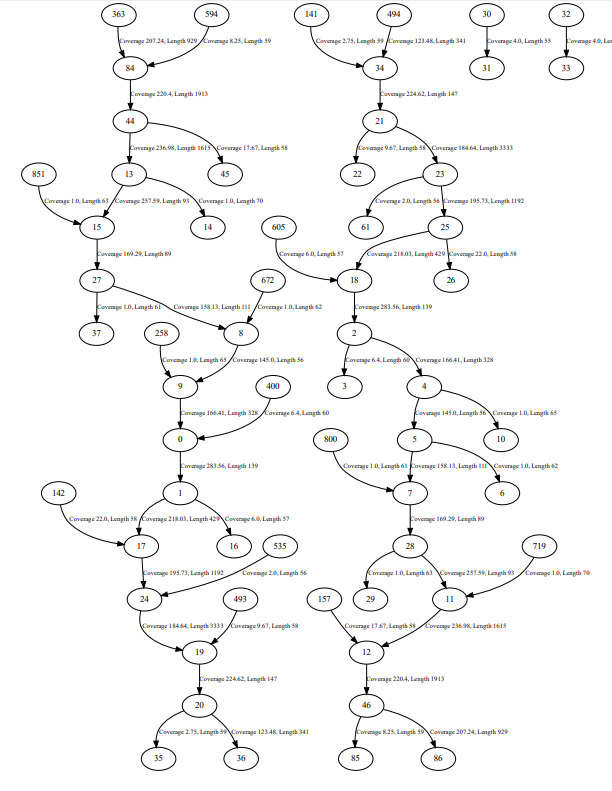

In [19]:
Image("data/5/tree10000_2_60.PNG")

### s_6.first10000.fastq with tip_clipper with cov_treshold 50 and len_treshold 100

In [27]:
graph10000.graph = copy.deepcopy(condensed10000)
graph10000.tip_clipper(50, 100)
graph10000.condense_graph()

graph10000.print_edges_to_fasta('s_6.first10000_tip_clipper_50_100.fasta')
graph10000.print_draw_graph('s_6.first10000_tip_clipper_50_100.dot', 's_6.first10000_tip_clipper_50_100.pdf')

Now graph consists of 2 edges of length 10000, which means that genome is basicly assembled

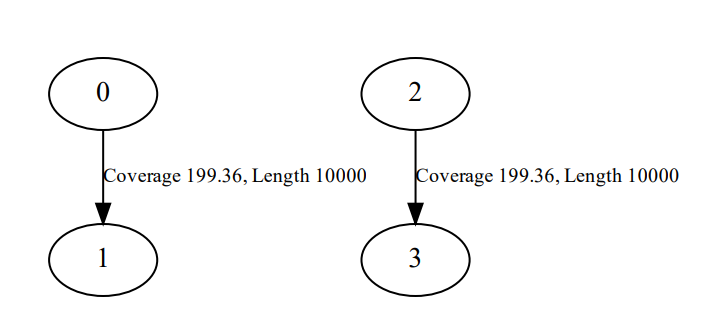

In [20]:
Image("data/5/tree10000_50_100.PNG")

### s_6.first10000.fastq with edge_filter with cov_treshold 2 and len_treshold 60

In [21]:
graph10000.graph = copy.deepcopy(condensed10000)
graph10000.edge_filter(10, 60)
graph10000.condense_graph()

graph10000.print_edges_to_fasta('s_6.first10000_edge_filter_2_60.fasta')
graph10000.print_draw_graph('s_6.first10000_edge_filter_2_60.dot', 's_6.first10000_edge_filter_2_60.pdf')

This graph is mush better than after tip_clipper with same thresholds - it doesn't have single edges. This is due to the fact that all the "bad" edges are removed, not just the tips.

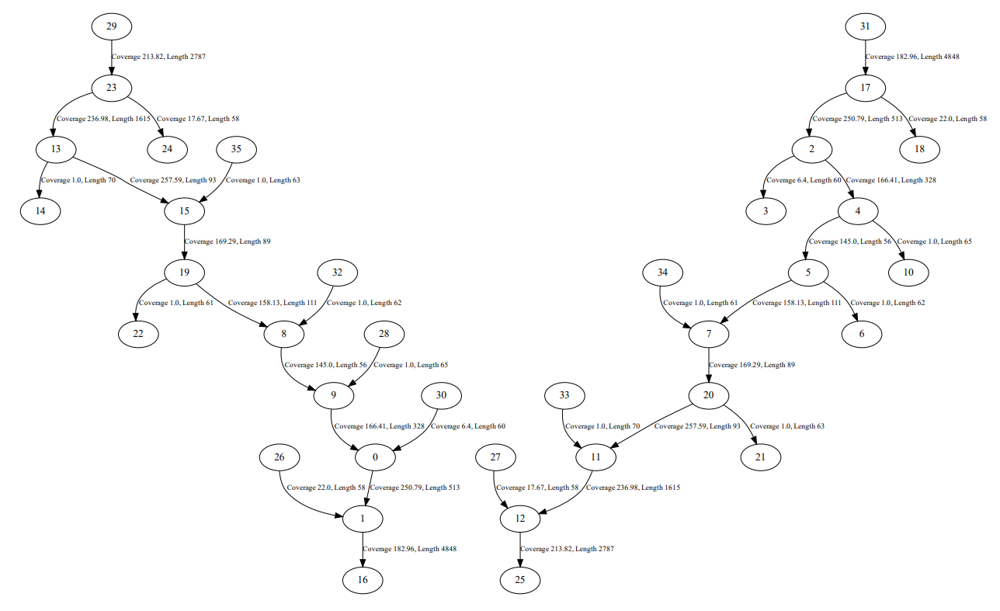

In [22]:
Image("data/5/tree10000_filter_2_60.PNG")

In [23]:
graph10000.edge_filter(50, 100)
graph10000.condense_graph()

graph10000.print_edges_to_fasta('s_6.first10000_edge_filter_50_100.fasta')
graph10000.print_draw_graph('s_6.first10000_edge_filter_50_100.dot', 's_6.first10000_edge_filter_50_100.pdf')

Here the result is the same as with tip_clipper - 2 edges of length 10000.

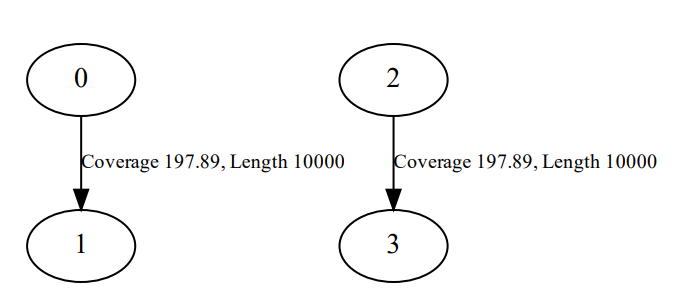

In [24]:
Image("data/5/tree10000_filter_50_100.PNG")

## Build a graph from s_6.first100000.fastq 

In [25]:
graph100000 = DeBrujinGraph(55, DATA_PATH + 's_6.first100000.fastq', True)
graph100000.build_primary_graph()
graph100000.condense_graph()

condensed100000 = copy.deepcopy(graph100000.graph)

### s_6.first100000.fastq with tip_clipper with cov_treshold 50 and len_treshold 100

In [28]:
graph100000.graph = copy.deepcopy(condensed100000)
graph100000.tip_clipper(50, 100)
graph100000.condense_graph()

graph100000.print_edges_to_fasta('s_6.first100000_tip_clipper_50_100.fasta')
graph100000.print_draw_graph('s_6.first100000_tip_clipper_50_100.dot', 's_6.first100000_tip_clipper_50_100.pdf')

The graph is big and complecated and consists of two connectivity components .

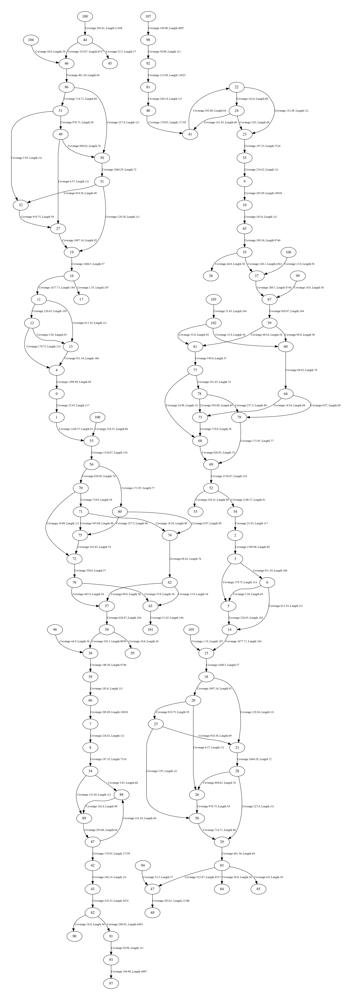

In [30]:
Image("data/5/s_6.first100000_tip_clipper_50_100.jpg")

### s_6.first100000.fastq with tedge_filter with cov_treshold 50 and len_treshold 100

In [31]:
graph100000.graph = copy.deepcopy(condensed100000)
graph100000.edge_filter(50, 100)
graph100000.condense_graph()

graph100000.print_edges_to_fasta('s_6.first100000_edge_filter_50_100.fasta')
graph100000.print_draw_graph('s_6.first100000_edge_filter_50_100.dot', 's_6.first100000_edge_filter_50_100.pdf')

The graph is much simpler. However, it broke up into several four connectivity components due to the fact that some connecting edges were insufficiently covered and long.

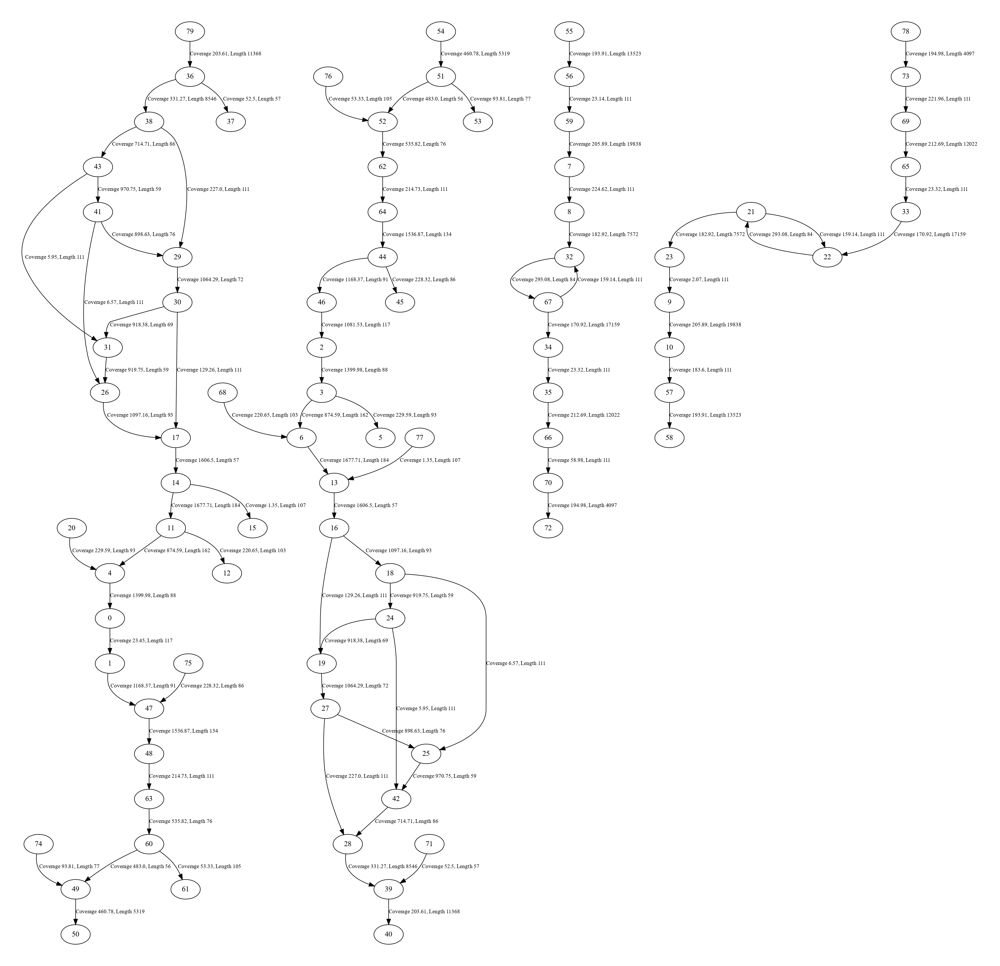

In [32]:
Image("data/5/s_6.first100000_edge_filter_50_100.jpg")

### s_6.first100000.fastq with tip_clipper with cov_treshold 200 and len_treshold 500

In [34]:
graph100000.graph = copy.deepcopy(condensed100000)
graph100000.tip_clipper(200, 500)
graph100000.condense_graph()

graph100000.print_edges_to_fasta('s_6.first100000_tip_clipper_200_500.fasta')
graph100000.print_draw_graph('s_6.first100000_tip_clipper_200_500.dot', 's_6.first100000_tip_clipper_200_500.pdf')

The graph is not must simplier than with tip_clipper(50, 100)

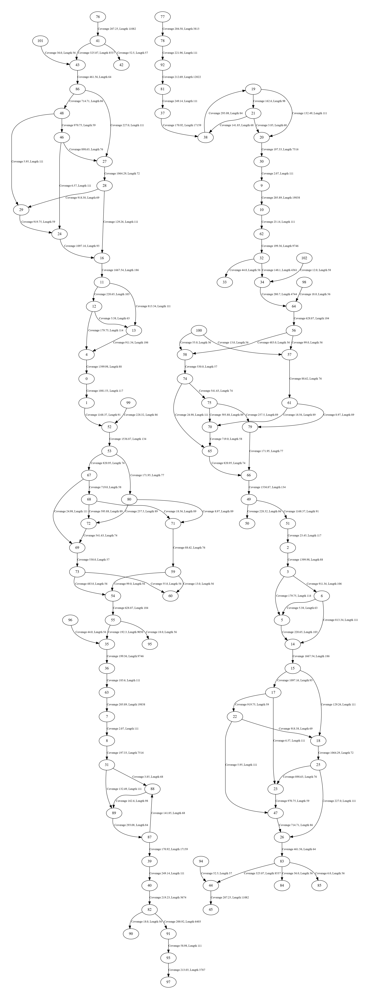

In [35]:
Image("data/5/s_6.first100000_tip_clipper_200_500.jpg")

### s_6.first100000.fastq with tedge_filter with cov_treshold 200 and len_treshold 500

In [36]:
graph100000.graph = copy.deepcopy(condensed100000)
graph100000.edge_filter(200, 500)
graph100000.condense_graph()

graph100000.print_edges_to_fasta('s_6.first100000_edge_filter_200_500.fasta')
graph100000.print_draw_graph('s_6.first100000_edge_filter_200_500.dot', 's_6.first100000_edge_filter_200_500.pdf')

This graph consists of lots of single edges + two quite simple graph. Probably in this case it's wirse that with tip_clipper

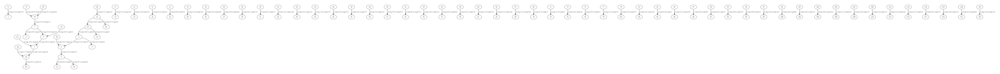

In [37]:
Image("data/5/s_6.first100000_edge_filter_200_500.jpg")

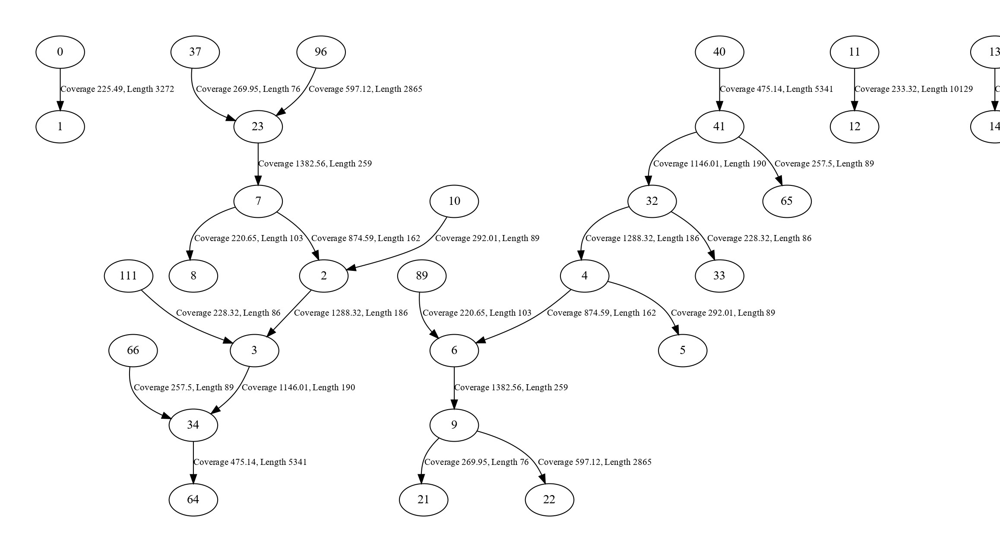

In [38]:
Image("data/5/s_6.first100000_edge_filter_200_500_cutted.jpg")

To sum up, edge_filter seems to be more effective, but it is important to choose thresholds carefully and not make them too high.